<a href="https://colab.research.google.com/github/MinakshiNannore/Netflix-Movies-and-TV-Shows-Clustering/blob/main/ML_Unsupervised_Netflix_Movies_and_TV_Shows_Clustering_By_Minakshi_Nannore.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Netflix Movies and TV Shows Clustering




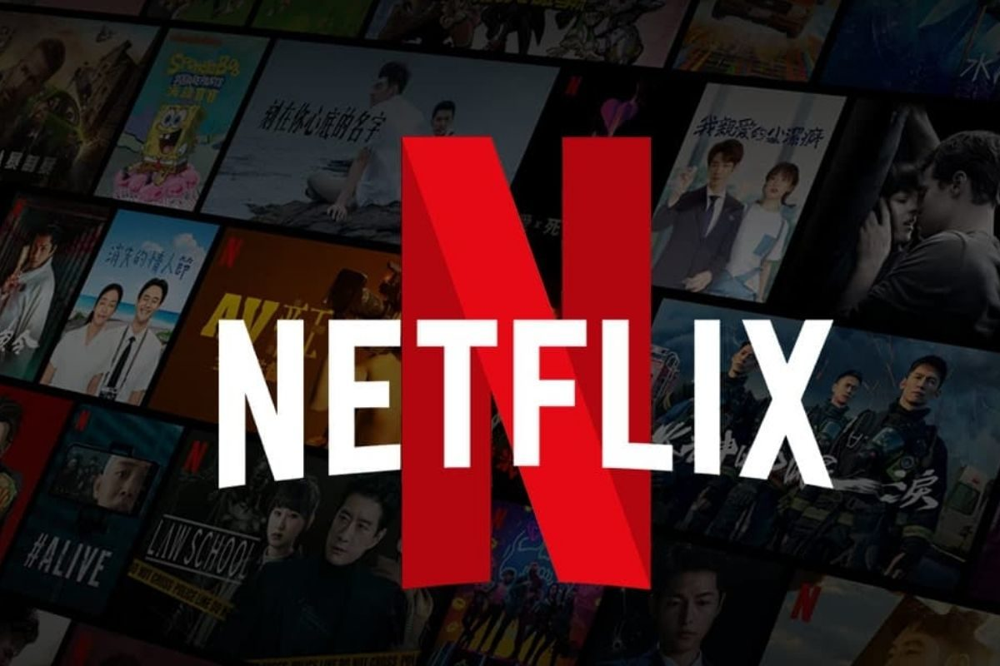

##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Name**           - Minakshi Nannore


# **Project Summary -**

**Data Preprocessing** : 

1. Getting the dataset.
2. Importing important libraries.
3. Importing dataset.
4. Check duplicate Data.
5. Check Missing Data.
6. Data wrangling.

**Exploratory data analysis(EDA) :** 

1. Firstly Checked individual percentage of TV shows and Movies of our dataset.

2. Checked total release of Movies and TV shows for last 15 year.

3. Checked month wise total release of Movies and TV shows.

4. Checked top 15 countries where most of Movies/shows are produced.

5. Checked top 10 directors who directs most of Movies/TV shows.

6. Checked top 10 actors who play most in Movies/TV shows.

7. Analyzed ratings based on TV shows and Movies.

8. Checked top 15 genres of Movies/TV shows on Netflix.

9. Checked most popular duration of contents on Netflix.

**Feature Engineering & Data Pre-processing :**

1. Handling Missing Values.
2. Textual Data Preprocessing.
3. Dimensionality Reduction.


**Used Machine learning algorithms :**

1. K-Means Clustering.

2. Hierarchical clustering.


# **GitHub Link -**

https://github.com/MinakshiNannore/Netflix-Movies-and-TV-Shows-Clustering

# **Problem Statement**


**Netflix is the most popular Internet television network in the world. It is a streaming service that offers a wide variety of television shows and movies for viewers to watch at their convenience.**
#####**This dataset consists of tv shows and movies available on Netflix as of 2019.Our project aims to classify and group Netflix shows into specific clusters in such a way that shows in the same cluster are similar to one another and shows in different clusters are different.**
#####**By creating clusters, we will be able to comprehend the shows that are alike and different from one another. These clusters can be used to provide customers with individualized show recommendations based on their preferences.**

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
# Import Libraries
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
# Mount google drive
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# import our dataset here
url='https://drive.google.com/file/d/1GJtn__tVmLbzZBikCgypDn3kTK57MVy8/view?usp=sharing'
url='https://drive.google.com/uc?id=' + url.split('/')[-2]
df = pd.read_csv(url)

### Dataset First View

In [ ]:
# Dataset First Look - let's look top 5 entries
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df.shape

(7787, 12)

### Dataset Information

In [ ]:
# Dataset Info - To get information of our data including column, null value, datatype
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
(df.duplicated(subset=None, keep='first')).value_counts()

False    7787
dtype: int64

There is no duplicate value in our dataset

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
# To check null values in our data
df.isnull().values.any()

True

In [ ]:
# Checking missing values in columns
df.isnull().sum().sort_values(ascending = False)

director        2389
cast             718
country          507
date_added        10
rating             7
show_id            0
type               0
title              0
release_year       0
duration           0
listed_in          0
description        0
dtype: int64

In [ ]:
# Calculate column wise null percentage
per_null_value = (round(100*(df.isnull().sum()/len(df.index)),2))
(per_null_value).sort_values(ascending = False).head(7)

director      30.68
cast           9.22
country        6.51
date_added     0.13
rating         0.09
show_id        0.00
type           0.00
dtype: float64

Text(0.5, 1.0, 'Visualizing the missing values')

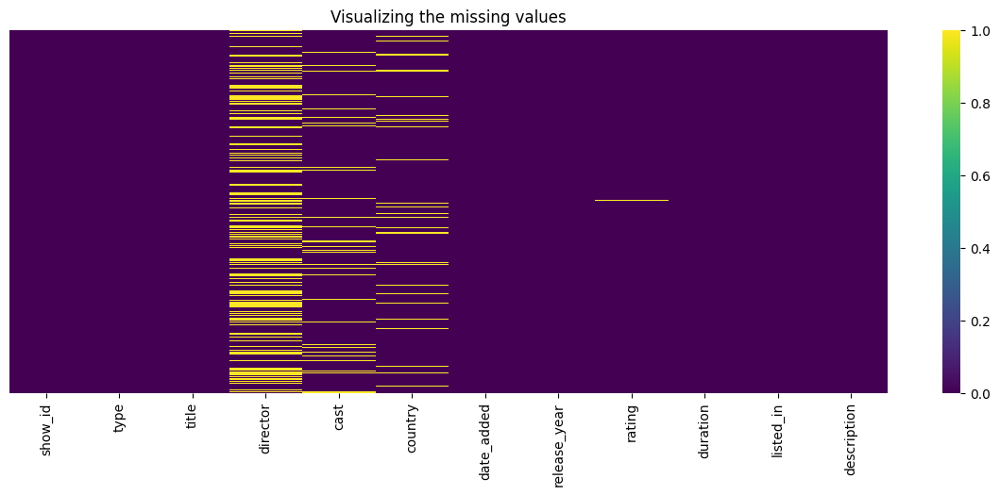

In [ ]:
# Visualizing the missing values
plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(),cmap = 'viridis', annot = False, yticklabels = False)
plt.title("Visualizing the missing values")

### What did you know about your dataset?

Our dataset containing 7787 records across 12 features with information about TV shows and Movies on Netflix. There is No duplicate values in our dataset, but contains Null values in some columns.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe().T

,count,mean,std,min,25%,50%,75%,max
release_year,7787.0,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0


### Variables Description 

**show_id :** Unique ID for every Movie / Tv Show

**type :** Identifier - A Movie or TV Show

**title :** Title of the Movie / Tv Show

**director :** Director of the Movie

**cast :** Actors involved in the movie / show

**country :** Country where the movie / show was produced

**date_added :** Date it was added on Netflix

**release_year :** Actual Releaseyear of the movie / show

**rating :** TV Rating of the movie / show

**duration :** Total Duration - in minutes or number of seasons

**listed_in :** Genere

**description:** The Summary description

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
df_variables = list(df.columns)

for m in df_variables:
  print(F"The unique values of {m} are {df[m].unique()}" + "\n")

The unique values of show_id are ['s1' 's2' 's3' ... 's7785' 's7786' 's7787']

The unique values of type are ['TV Show' 'Movie']

The unique values of title are ['3%' '7:19' '23:59' ... 'Zulu Man in Japan' "Zumbo's Just Desserts"
 "ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS"]

The unique values of director are [nan 'Jorge Michel Grau' 'Gilbert Chan' ... 'Josef Fares' 'Mozez Singh'
 'Sam Dunn']

The unique values of cast are ['João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi'
 'Demián Bichir, Héctor Bonilla, Oscar Serrano, Azalia Ortiz, Octavio Michel, Carmen Beato'
 'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim'
 ...
 'Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanana, Manish Chaudhary, Meghna Malik, Malkeet Rauni, Anita Shabdish, Chittaranjan Tripathy'
 'Nasty C' 'Adriano Zumbo, Rachel Khoo']

The unique va

In [ ]:
# Check unique values counts for each variable
for i in df.columns.tolist():
  print("No. of unique values in",i,"is",df[i].nunique())

No. of unique values in show_id is 7787
No. of unique values in type is 2
No. of unique values in title is 7787
No. of unique values in director is 4049
No. of unique values in cast is 6831
No. of unique values in country is 681
No. of unique values in date_added is 1565
No. of unique values in release_year is 73
No. of unique values in rating is 14
No. of unique values in duration is 216
No. of unique values in listed_in is 492
No. of unique values in description is 7769


## 3. ***Data Wrangling***

### Data Wrangling Code

#### **Extract added month and year from date_added**

In [ ]:
# Create new features from date_added
df["date_added"] = pd.to_datetime(df['date_added'])
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month

### What all manipulations have you done and insights you found?

Here we extract month_added and year_added from date_added column and create two new features.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

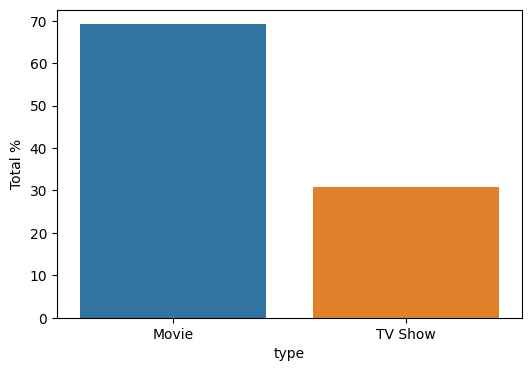

In [ ]:
# Chart - 1 visualization code to plot different categories in 'type'
grp_by_type = df.groupby('type')
df11 = pd.DataFrame((grp_by_type.size()/df.shape[0])*100).reset_index().rename(columns = {0:'Total %'}) 
plt.figure(figsize = (6,4))
sns.barplot(x = df11['type'], y = df11['Total %'] )
plt.show()

##### 1. Why did you pick the specific chart?

To check individual percentage of TV shows and Movies of our dataset

##### 2. What is/are the insight(s) found from the chart?

we have around 69% and 31% records of Movies and TV shows respectively.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 2

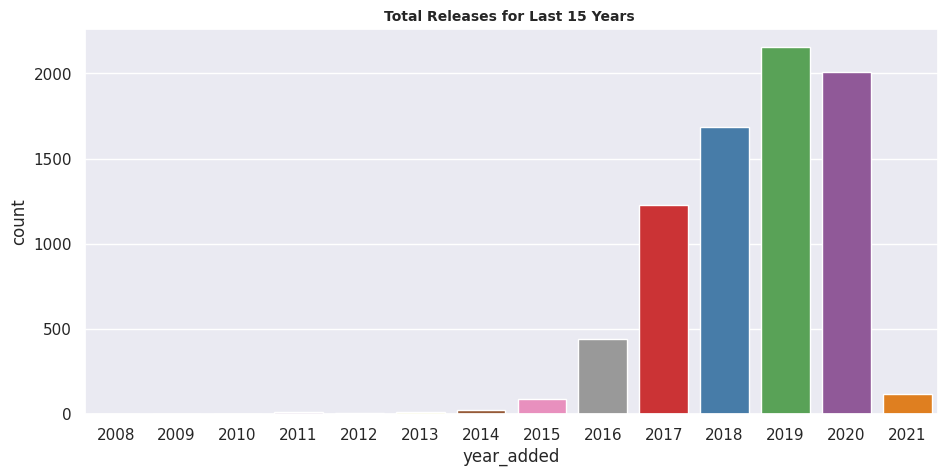

In [ ]:
# Chart-2 visualization code to check Total release for last 15 years
sns.set(rc={'figure.figsize':(11,5)})
sns.countplot(x='year_added',data = df,palette="Set1")

plt.title('Total Releases for Last 15 Years ',size='10',fontweight="bold")    
plt.show()

<Axes: xlabel='year_added', ylabel='count'>

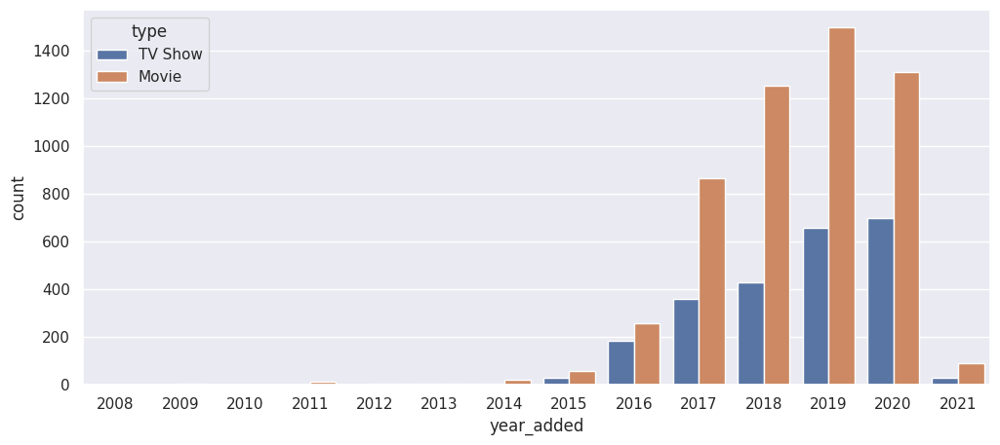

In [ ]:
# visualization code to check different type of Total release for last 15 years
fig, ax = plt.subplots(figsize=(12,5))

sns.countplot(x='year_added', hue='type', data=df, ax=ax)

##### 1. Why did you pick the specific chart?

To check total release of Movies and TV shows for last 15 year.

##### 2. What is/are the insight(s) found from the chart?

We see Netflix have highest release in 2019 followed by 2020 and 2018 and  for each year release of Movies is more than TV shows.
#####Also The number of release have significantly increased after 2015 and have dropped in 2021 which may be due to Covid 19.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 3

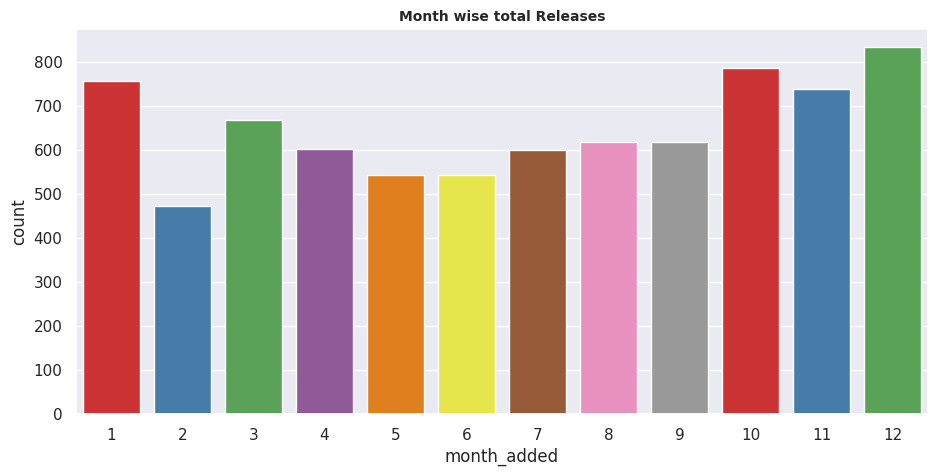

In [ ]:
# Chart-3 visualization code to check month wise release
sns.set(rc={'figure.figsize':(11,5)})
sns.countplot(x='month_added',data = df, palette="Set1")

plt.title('Month wise total Releases',size='10',fontweight="bold")    
plt.show()

<Axes: xlabel='month_added', ylabel='count'>

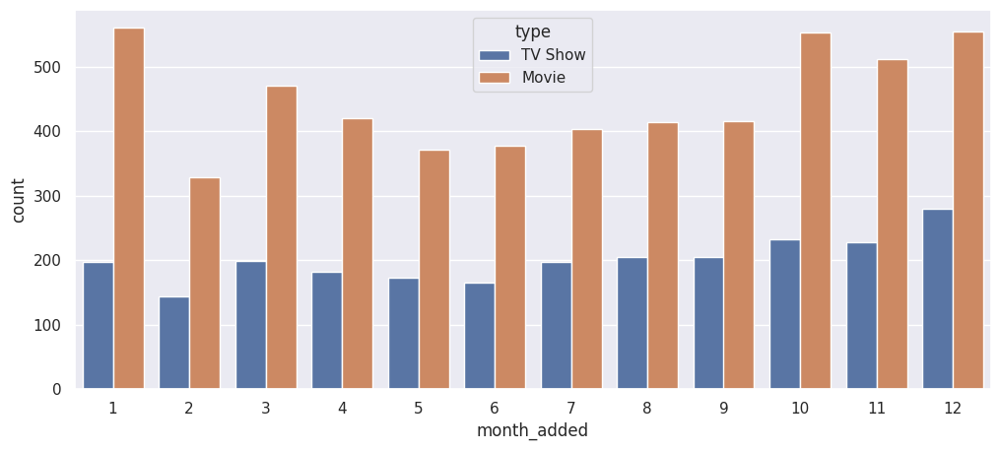

In [ ]:
# visualization code to check month wise different type of Total release
fig, ax = plt.subplots(figsize=(12,5))

sns.countplot(x='month_added', hue='type', data=df, ax=ax)

##### 1. Why did you pick the specific chart?

To check month wise total release of Movies and TV shows.

##### 2. What is/are the insight(s) found from the chart?

We see more release happened in months October, November, December and January. Also for each month release of Movies is more than TV shows.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 4

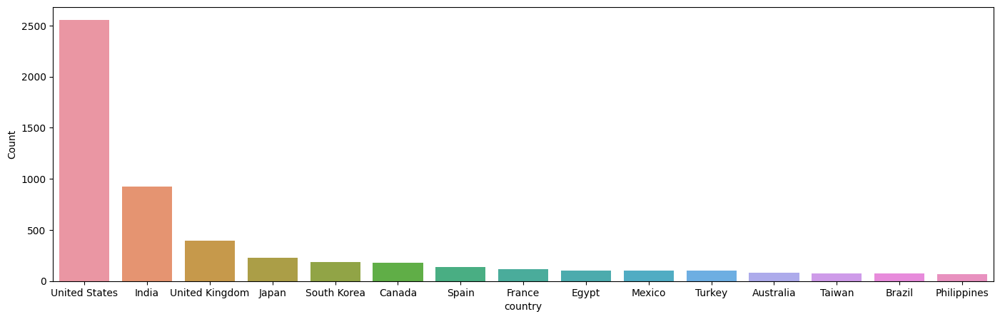

In [ ]:
# Chart- 4  visualization code to see countries where most of contents are produced
grp_by_country = df.groupby('country')
df11 = pd.DataFrame(grp_by_country.size()).reset_index().rename(columns = {0:'Count'}).sort_values('Count', ascending = False)[:15]
plt.figure(figsize = (17,5))
sns.barplot(x = df11['country'], y  = df11['Count'])
plt.show()

##### 1. Why did you pick the specific chart?

To check top 15 countries where most of Movies/shows are produced.

##### 2. What is/are the insight(s) found from the chart?

We see most of contents are produced by united states followed by India.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 5

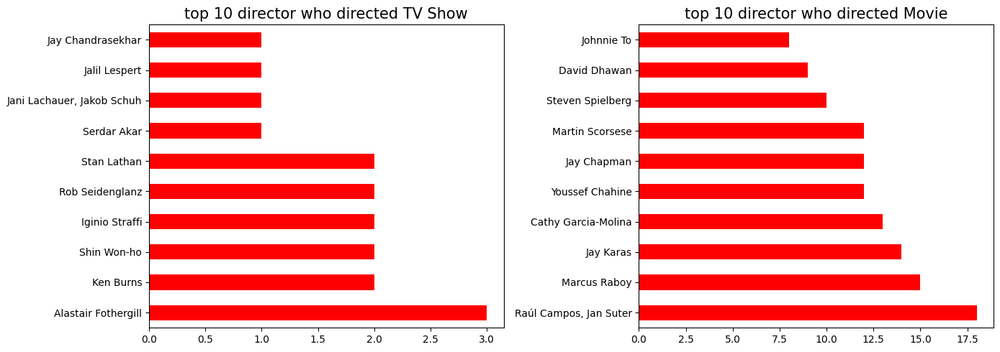

In [ ]:
# Chart- 4  visualization code to see top 10 director for Movies/TV shows
fig,ax = plt.subplots(1,2, figsize=(14,5))

# top 10 director who directed TV show
show_dic = df[df['type']=='TV Show']['director'].value_counts()[:10].plot(kind='barh', ax=ax[0], color = 'red')
show_dic.set_title('top 10 director who directed TV Show', size=15)

# top 10 director who directed movie
movie_dic = df[df['type']=='Movie']['director'].value_counts()[:10].plot(kind='barh', ax=ax[1], color = 'red')
movie_dic.set_title('top 10 director who directed Movie', size=15)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

To check top 10 directors who directs most of Movies/TV shows.

##### 2. What is/are the insight(s) found from the chart?

Most of the contents directed by;
##### **Alastair Fothergill** for TV shows.
##### **Raul Campos, Jan Suter** for movies.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 6

In [ ]:
# seperating actor from cast column
cast = df['cast'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)

# seperating TV shows actor from cast column
top_TVshows_actor = df[df['type']=='TV Show']['cast'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)

# seperating movie actor from cast column
top_movie_actor = df[df['type']=='Movie']['cast'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)

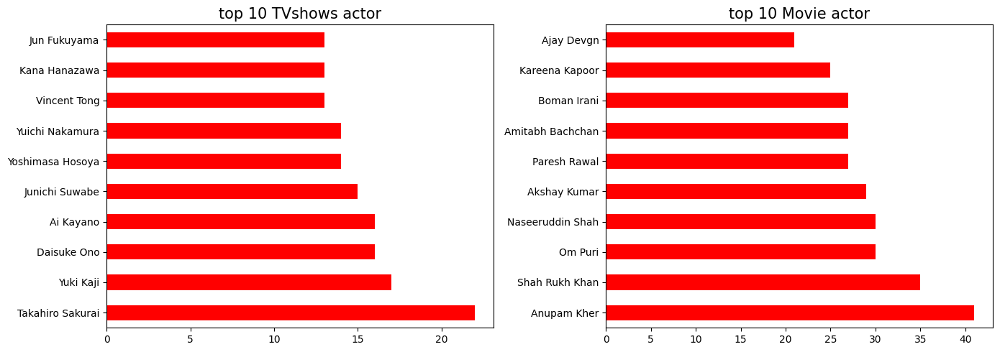

In [ ]:
# Chart - 6 visualization code to see top 10 actors for Movie/TV show
fig,ax = plt.subplots(1,2, figsize=(14,5))

# plotting actor who play role in highest number of TV Show
top_actors1 = top_TVshows_actor.value_counts().head(10).plot(kind='barh', ax=ax[0], color = 'red')
top_actors1.set_title('top 10 TVshows actor', size=15)

# plotting actor who play role in highest number of Movie
top_actors2 = top_movie_actor.value_counts().head(10).plot(kind='barh', ax=ax[1], color = 'red')
top_actors2.set_title('top 10 Movie actor', size=15)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

To check top 10 actors who play most in Movies/TV shows.

##### 2. What is/are the insight(s) found from the chart?

Most of the contents acted by;
##### **Takahiro Sakurai** for TV shows.
##### **Anupam Kher** for movies.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 7

In [ ]:
# Creating two new columns

tv_shows = df[df['type']=='TV Show']
movies = df[df['type']=='Movie'] 

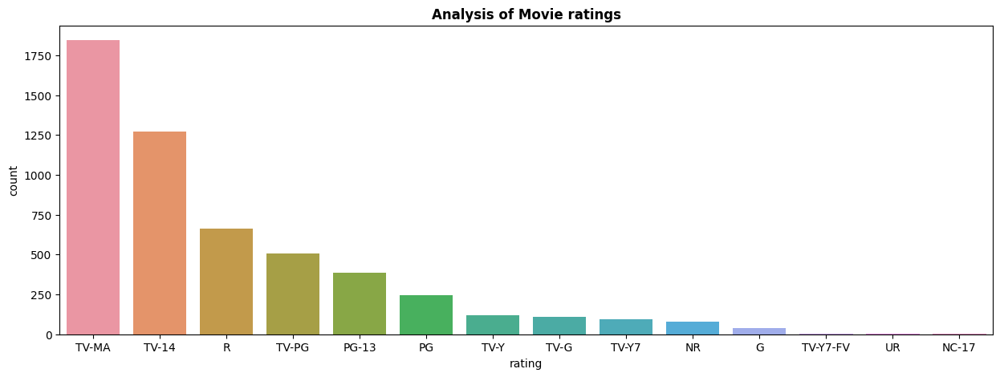

In [ ]:
# Chart - 7(a) visualization code to  Analyze ratings based on Movies
movies_ratings = movies.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)
fig, ax = plt.subplots(figsize=(15,5))  
sns.barplot(x='rating',y='count',data=movies_ratings)
plt.title('Analysis of Movie ratings', fontsize=12, fontweight='bold')
plt.show()

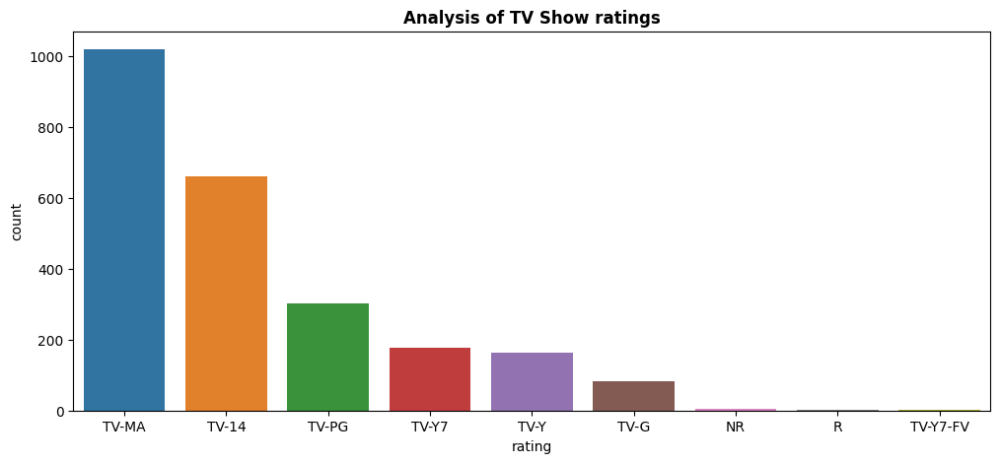

In [ ]:
# Chart - 7(b) visualization code to  Analyze ratings based on TV Shows
tv_shows_ratings = tv_shows.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)
fig, ax = plt.subplots(figsize=(12,5))  
sns.barplot(x='rating',y='count',data=tv_shows_ratings)
plt.title('Analysis of TV Show ratings', fontsize=12, fontweight='bold')
plt.show()

##### 1. Why did you pick the specific chart?

To analyze ratings based on TV shows and Movies.

##### 2. What is/are the insight(s) found from the chart?

we see TV-MA(adults) has highest rating in both cases (TV-shows/Movies) followed by TV-14 (Teens).

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 8

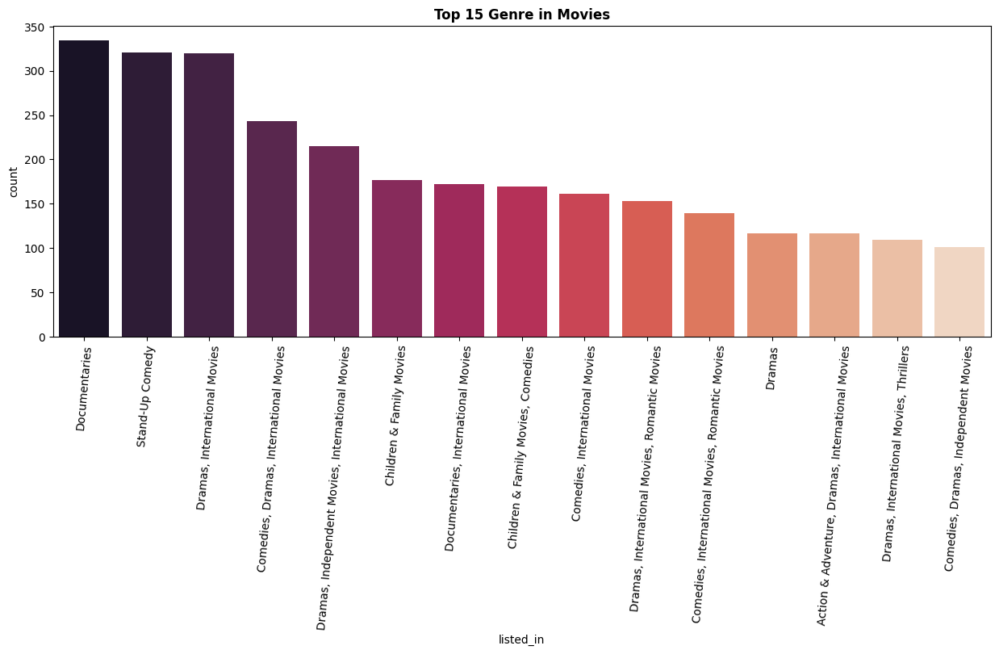

In [ ]:
# Chart - 8(a) visualization code to see Top 15 Genre in movies

plt.figure(figsize=(15,5))
sns.countplot(x="listed_in", data=movies, palette="rocket", order=movies['listed_in'].value_counts().index[0:15])
plt.xticks(rotation=85)
plt.title('Top 15 Genre in Movies', fontsize=12, fontweight='bold')
plt.show()

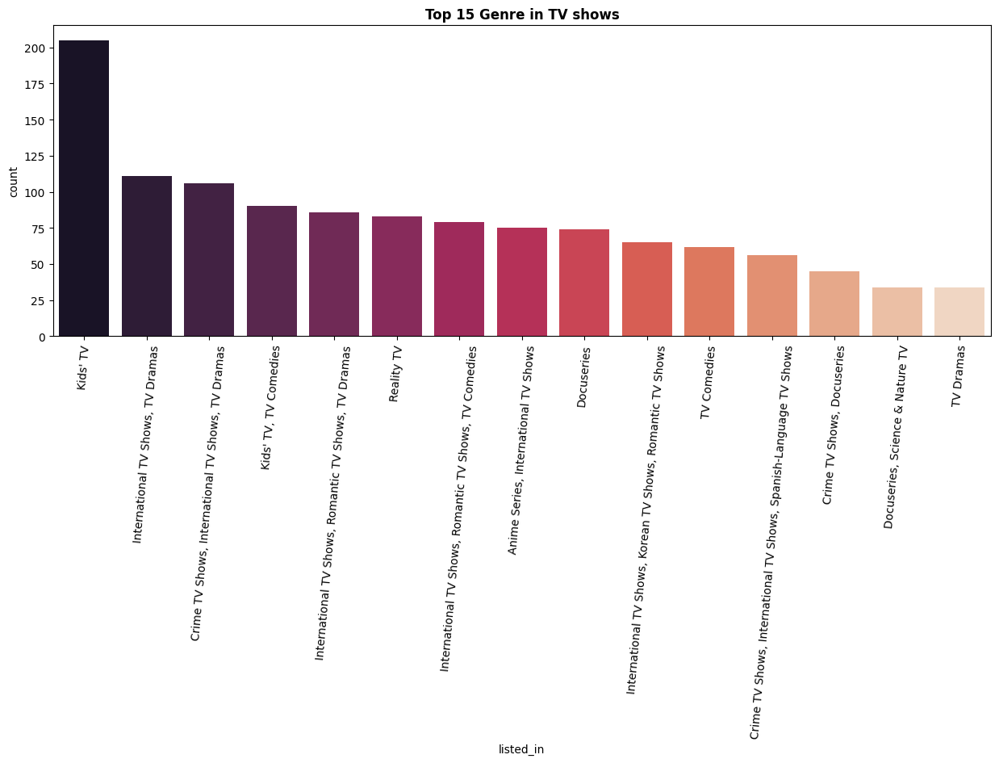

In [ ]:
# Chart - 8(b) visualization code to see Top 15 Genre in TV shows
plt.figure(figsize=(15,5))
sns.countplot(x="listed_in", data=tv_shows, palette="rocket", order=tv_shows['listed_in'].value_counts().index[0:15])
plt.xticks(rotation=85)
plt.title('Top 15 Genre in TV shows', fontsize=12, fontweight='bold')
plt.show()

##### 1. Why did you pick the specific chart?

To check top 15 genres of Movies/TV shows on Netflix.

##### 2. What is/are the insight(s) found from the chart?

* For Movies - Top Genre postion took by Documentry followed by Stand-up Comedy and Dramas,International Movies.
* For TV shows - Top Genre postion took by kid's TV followed by International TV shows and TV Dramas.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

#### Chart - 9

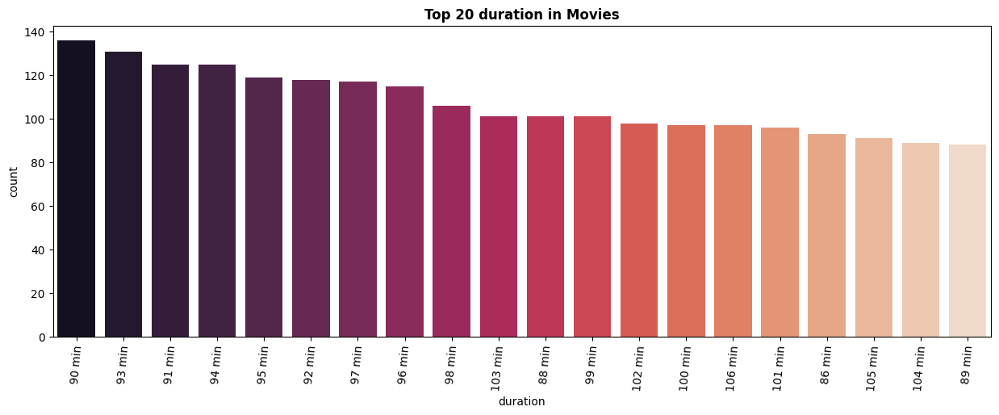

In [ ]:
# Chart - 9(a) visualization code to see Top 20 duration in movies

plt.figure(figsize=(15,5))
sns.countplot(x="duration", data=movies, palette="rocket", order=movies['duration'].value_counts().index[0:20])
plt.xticks(rotation=85)
plt.title('Top 20 duration in Movies', fontsize=12, fontweight='bold')
plt.show()

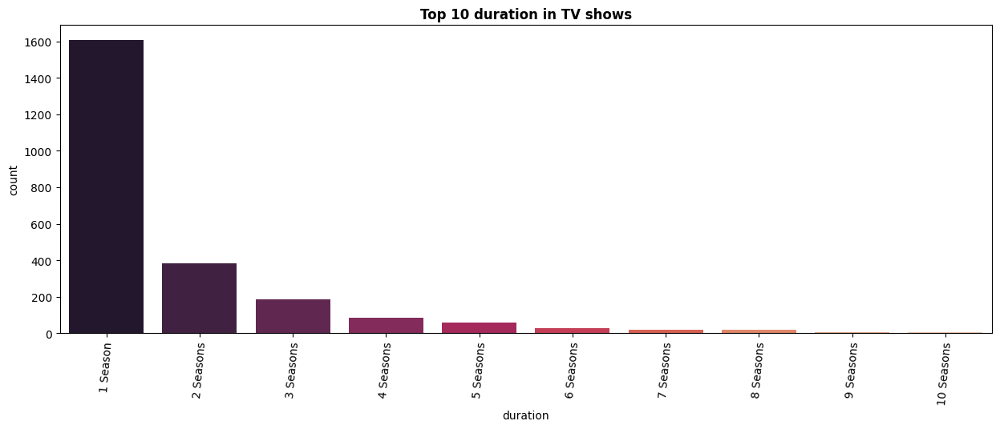

In [ ]:
# Chart - 9(b) visualization code to see Top 10 duration in TV shows

plt.figure(figsize=(15,5))
sns.countplot(x="duration", data=tv_shows, palette="rocket", order=tv_shows['duration'].value_counts().index[0:10])
plt.xticks(rotation=85)
plt.title('Top 10 duration in TV shows', fontsize=12, fontweight='bold')
plt.show()

##### 1. Why did you pick the specific chart?

To check most popular duration of contents on Netflix.

##### 2. What is/are the insight(s) found from the chart?

* We see most of Movies have duration of 90 to 100 minutes.
* Most of TV shows have only single season.



##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insight will help creating a positive business impact

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
df[['director','country','cast']] = df[['director','country','cast']].fillna('')
df['rating'] = df['rating'].fillna(df['rating'].mode()[0])
df.dropna(axis=0, inplace = True)

In [ ]:
# Now check if all Null values are removed
df.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
year_added      0
month_added     0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

The null values in the director, country and cast columns are filled with the string "unknown". Mode value is used to fill the null values in the rating column. Finally, the records with null values in the "date_added" column have been removed.

### 2. Handling Outliers

The data that we need to create cluster/building model are present in textual foramat. so there is no need to check for outliers.

In [ ]:
# check for columns we have
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'year_added', 'month_added'],
      dtype='object')

In [ ]:
# creating a copy of our dataset
df2 = df.copy()

In [ ]:
# check for columns we have
df2.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'year_added', 'month_added'],
      dtype='object')

### 3. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

**Textual data preprocessing -** Textual data preprocessingis the process of preparing text data for analysis or modeling. It includes a series of steps that are applied to raw text data in order to clean, organize and standardize it so that it can be easily analyzed or used as input for natural language processing or machine learning models.

In [ ]:
# import some important libraries for NLP
# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


####  Expand Contraction

We will cluster the Netflix movies and TV shows into groups based on the following textual characteristics:
* Director
* Cast
* Country
* Rating
* Listed in (genres)
* Description


In [ ]:
# Expand Contraction
# creating tags column using all text column which one is used for model building purpose.
df2['text_data'] = df2['director'] + df2['cast'] + df2['country'] + df2['rating'] + df2['listed_in'] + df2['description']

# checking the first row
df2['text_data'][0]

'João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazilTV-MAInternational TV Shows, TV Dramas, TV Sci-Fi & FantasyIn a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

We were successfully able to merge all of the required data into a single column.

####  Lower Casing &  Removing Stopwords 

In [ ]:
# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
# function to remove stop word and do lower casing
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# applying stopwords function.
df2['text_data'] = df2['text_data'].apply(stopwords)

In [ ]:
# now checking the first row again
df2['text_data'][0]

'joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibraziltv-mainternational tv shows, tv dramas, tv sci-fi & fantasyin future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.'

We have successfully done lowercasing and removed all stopwords.

####  Removing Punctuations

In [ ]:
# define a function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# applying remove_punctuation function
df2['text_data'] = df2['text_data'].apply(remove_punctuation)

In [ ]:
# now checking the first row
df2['text_data'][0]

'joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

We have successfully able to remove all the punctuation marks.

#### Stemming

The goal of stemming is to reduce words to their base form so that words with the same stem are treated as the same word, even if they are written in different forms.

In [ ]:
# create an object of stemming function
stemmer = SnowballStemmer("english")

# define a function to apply stemming using SnowballStemmer
def stemming(text):    
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [ ]:
# appying stemming function
df2['text_data'] = df2['text_data'].apply(stemming)

In [ ]:
# checking the first row after the process
df2['text_data'][0]

'joão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmaintern tv show tv drama tv scifi fantasyin futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalor'

We have successfully utilized the stemming process.

####  Text Vectorization

Text vectorization is the process of converting text data into numerical vectors. Here we will be using the TF-IDF vectorizer.

In [ ]:
# create the object of TF-IDF vectorizer
tf_idf_vec = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000) 

# fit the vectorizer using the text data
tf_idf_vec.fit(df2['text_data'])

# collect the vocabulary items used in the vectorizer
dictionary = tf_idf_vec.vocabulary_.items()

In [ ]:
 #number of independet features created from "text_data" columns
print(len(dictionary))

10000


In [ ]:
# convert vector into array form for clustering
vector = tf_idf_vec.transform(df2['text_data']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7777, 10000)
datatype : <class 'numpy.ndarray'>


### 4. Dimesionality Reduction

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while retaining as much information as possible. The main goal of dimensionality reduction is to simplify the data while minimizing the loss of information.
##### Here we will be using Principal Component Analysis (PCA) to reduce the dimensionality of data.

In [ ]:
# DImensionality Reduction (If needed)

# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

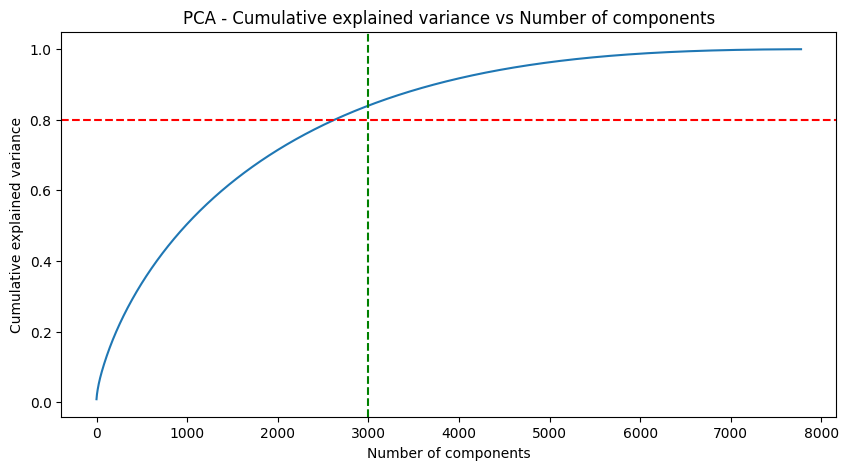

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

3000 components alone account for more than 80% of the variance. Therefore, we can take the top 3000 components to reduce dimensionality and simplify the model while still being able to capture more than 80% of the variance.

In [ ]:
# reducing the dimensions to 3000 using PCA
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [ ]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7777, 3000)

## ***7. ML Model Implementation***

### ML Model - 1

####**K-Means Clustering**

In [ ]:
# import libraries for clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [ ]:
# ML Model - 1 Implementation
#finding optimal number of clusters using the elbow method  
from sklearn.cluster import KMeans  
wcss_list= []  #Initializing the list for the values of WCSS  
  
#Using for loop for iterations from 1 to 30.  
for i in range(1, 15):  
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state= 42)  
    kmeans.fit(X) 
    # Compute the sum of squared errors for the model 
    wcss_list.append(kmeans.inertia_)  


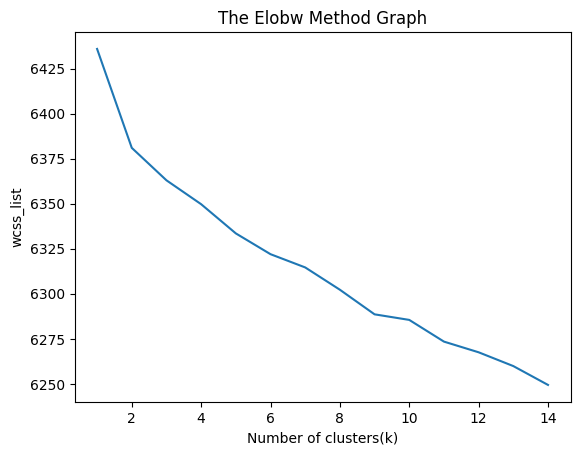

In [ ]:
# Plot the values of wcss
plt.plot(range(1, 15), wcss_list)  
plt.title('The Elobw Method Graph')  
plt.xlabel('Number of clusters(k)')  
plt.ylabel('wcss_list')  
plt.show()

In [ ]:
# sillhoute score of clusters 
sill_score = [] 
for i in range(2,16):
    model = KMeans(n_clusters=i,init ='k-means++',random_state=42)
    model.fit(X)
    y1 = model.predict(X)
    score = silhouette_score(X,y1)
    sill_score.append(score)
    print('cluster: %d \t Sillhoute: %0.4f'%(i,score))

cluster: 2 	 Sillhoute: 0.0057
cluster: 3 	 Sillhoute: 0.0063
cluster: 4 	 Sillhoute: 0.0064
cluster: 5 	 Sillhoute: 0.0034
cluster: 6 	 Sillhoute: 0.0040
cluster: 7 	 Sillhoute: 0.0065
cluster: 8 	 Sillhoute: 0.0047
cluster: 9 	 Sillhoute: 0.0056
cluster: 10 	 Sillhoute: 0.0044
cluster: 11 	 Sillhoute: 0.0051
cluster: 12 	 Sillhoute: 0.0053
cluster: 13 	 Sillhoute: 0.0051
cluster: 14 	 Sillhoute: 0.0055
cluster: 15 	 Sillhoute: 0.0055


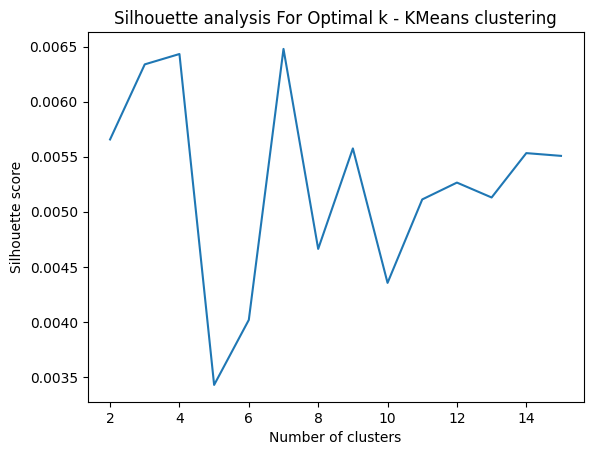

In [ ]:
# Plot the Silhouette analysis
plt.plot(range(2,16), sill_score)
plt.xlabel('Number of clusters') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

we obtained highest and approximate same Silhouette score for 4 & 6 clusters. Here we building 6 clusters using the k-means clustering algorithm.

In [ ]:
# Clustering the data into 6 clusters
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=42)
kmeans.fit(X)

KMeans(n_clusters=6, random_state=42)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6321.992321979424, 0.004017962985560016)


In [ ]:
# Adding a kmeans cluster number attribute
df2['kmeans_cluster'] = kmeans.labels_

In [ ]:
# Check the dataframe 
df2.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
312,Movie,Aditi Mittal: Things They Wouldn't Let Me Say,Fazila Allana,Aditi Mittal,India,TV-MA,Stand-Up Comedy,Trailblazing comic Aditi Mittal mixes topical ...,4
930,Movie,Bilu Rakkhosh,Indrasis Acharya,"Joy Sengupta, Koneenica Banerjee, Kanchana Moi...",India,TV-MA,"Dramas, International Movies","Torn between his demanding corporate career, h...",1
2716,TV Show,Hibana: Spark,,"Kento Hayashi, Kazuki Namioka, Mugi Kadowaki, ...",Japan,TV-MA,"International TV Shows, TV Dramas",A dramatic series about friendship and conflic...,0
613,Movie,Atlas Shrugged: Part II,John Putch,"Samantha Mathis, Jason Beghe, Esai Morales, Pa...",United States,PG-13,Dramas,"With the world's economy in dire straits, corp...",5
6182,Movie,The Bros,You-Jeong Chang,"Dong-hwi Lee, Dong-seok Ma, Ha-Nui Lee, Woo-ji...",South Korea,TV-14,"Comedies, Dramas, International Movies",Reunited in their hometown for their father's ...,1


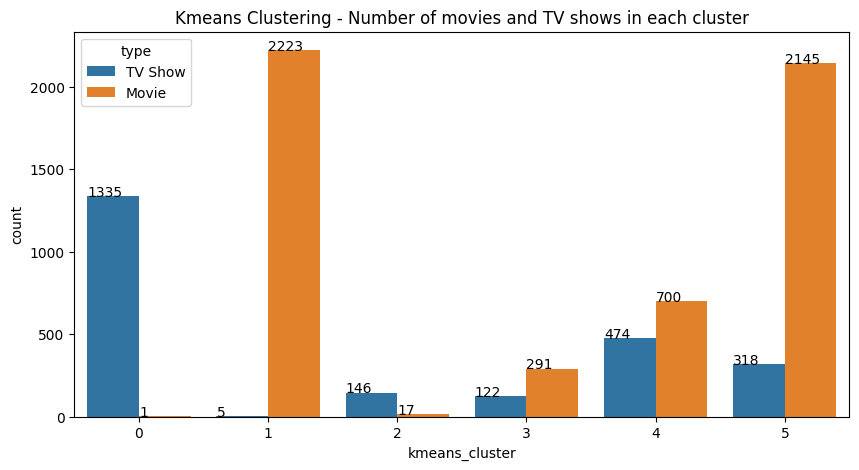

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='kmeans_cluster',data=df2, hue='type')
plt.title('Kmeans Clustering - Number of movies and TV shows in each cluster')

# adding value count on the top of bar
for p in graph.patches:
  graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

we have successfully built 6 clusters using the k-means clustering algorithm.

**Building wordclouds for different clusters built:**

Word clouds are graphical representations of word frequency that give greater prominence to words that appear more frequently in a source text.

In [ ]:
# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

In [ ]:
def kmeans_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  df2_wordcloud = df2[['kmeans_cluster',column_name]].dropna()
  df2_wordcloud = df2_wordcloud[df2_wordcloud['kmeans_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in df2_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Word Cloud on **"description"** column for different cluster

cluster 0


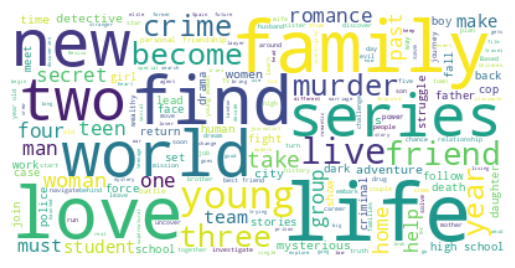

cluster 1


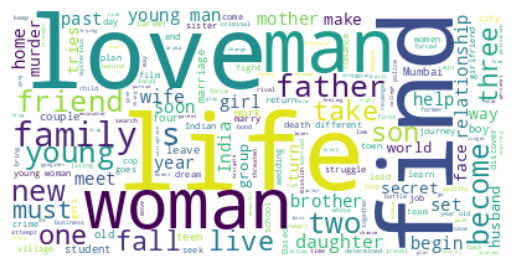

cluster 2


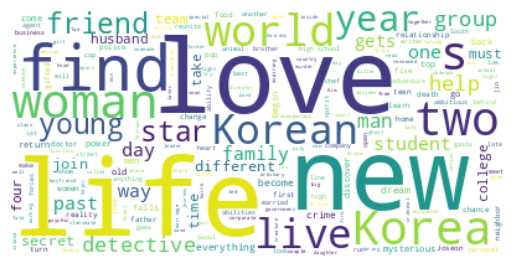

cluster 3


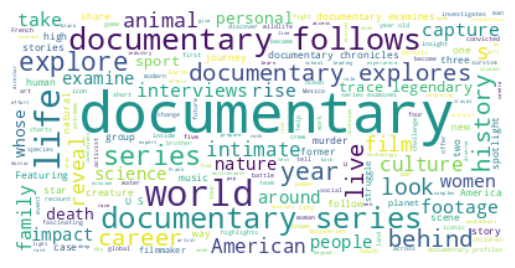

cluster 4


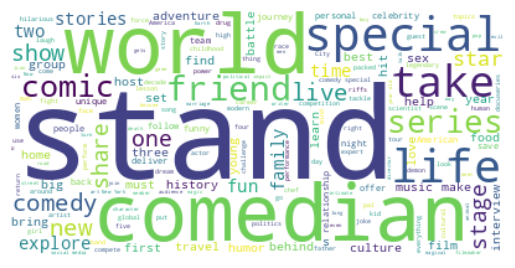

cluster 5


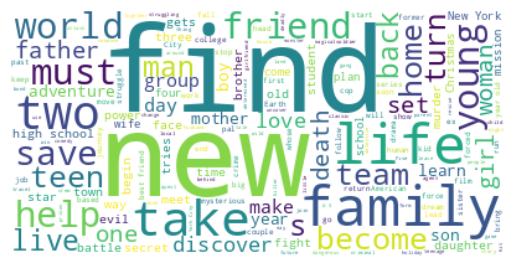

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

Word Cloud on **"listed_in" (genre)** col for different cluster

cluster 0


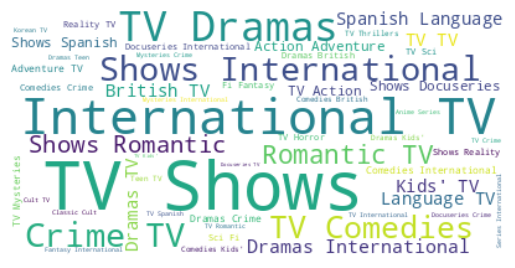

cluster 1


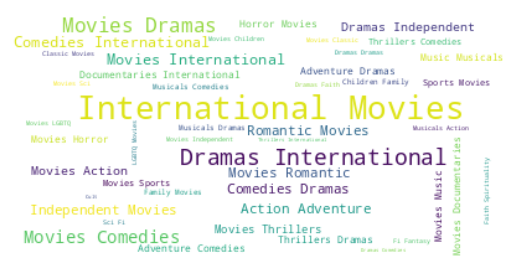

cluster 2


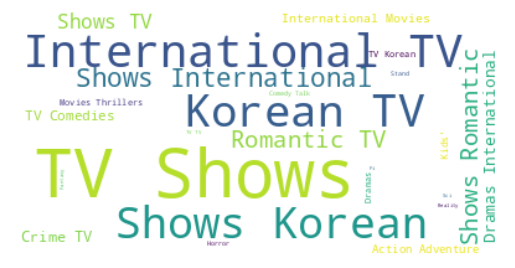

cluster 3


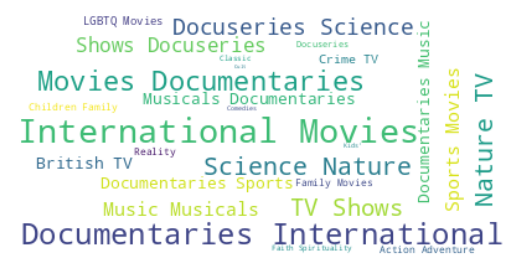

cluster 4


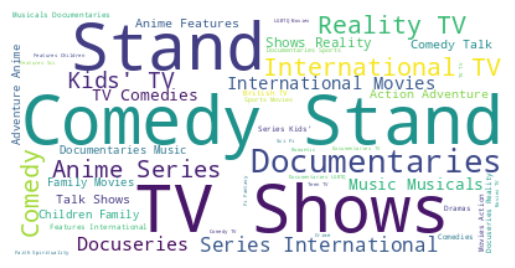

cluster 5


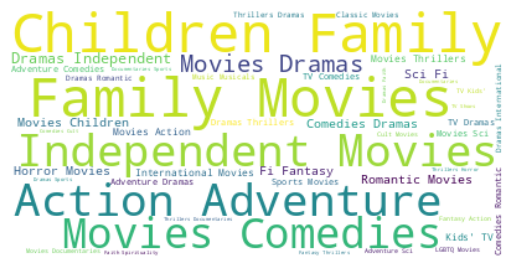

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

Word Cloud on **"cast"** column for different cluster

cluster 0


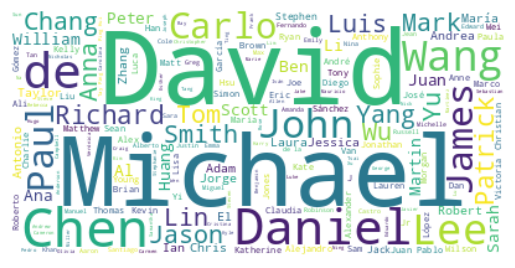

cluster 1


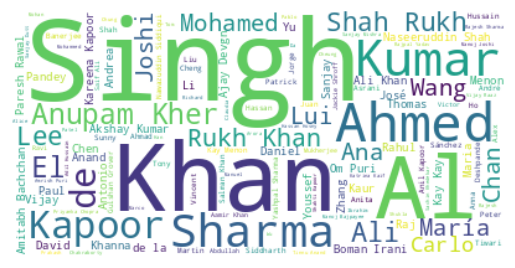

cluster 2


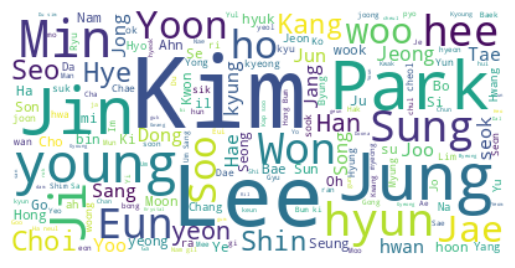

cluster 3


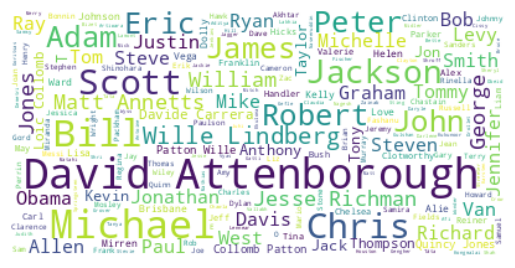

cluster 4


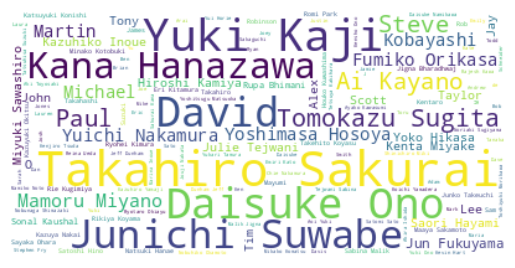

cluster 5


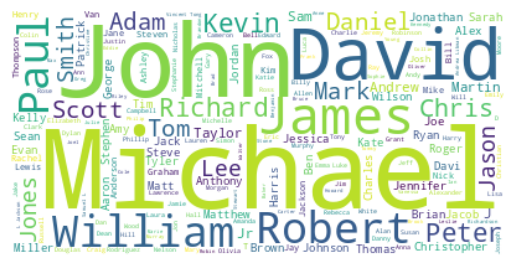

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

Word Cloud on **"director"** column for different cluster

cluster 0


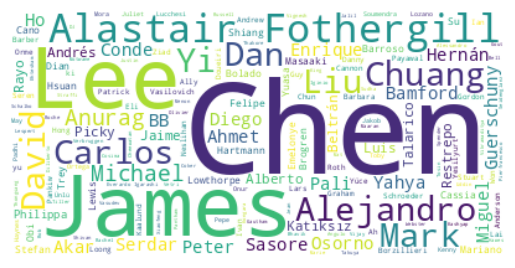

cluster 1


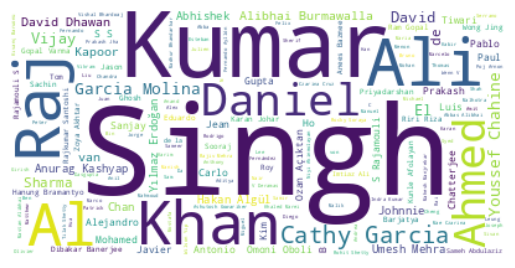

cluster 2


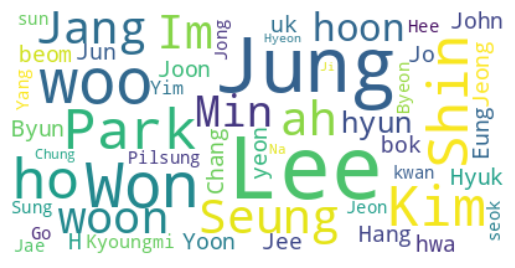

cluster 3


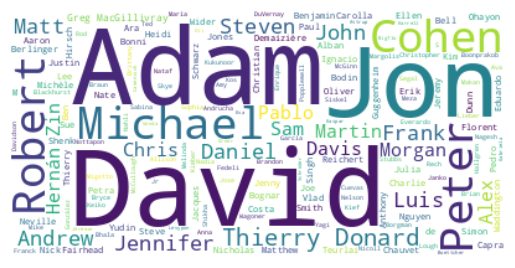

cluster 4


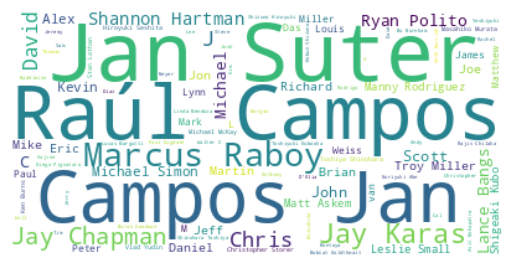

cluster 5


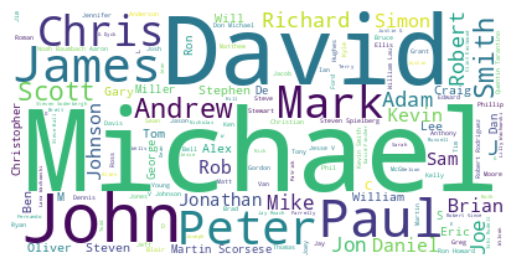

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

Word Cloud on **"country"** column for different cluster

cluster 0


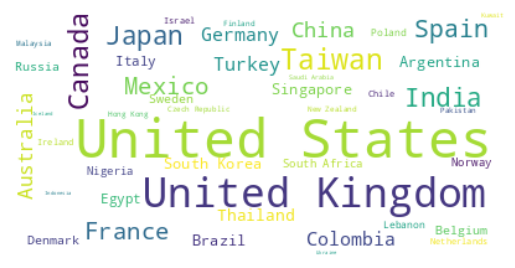

cluster 1


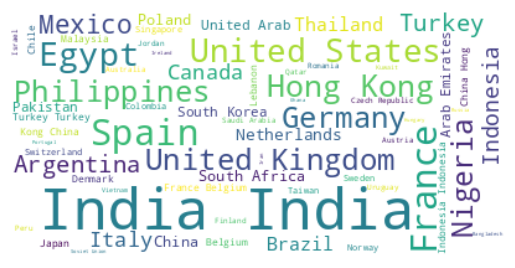

cluster 2


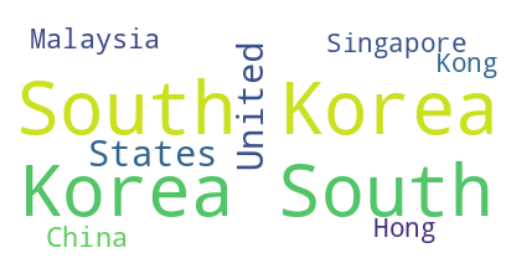

cluster 3


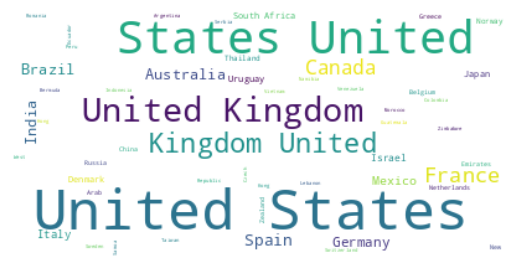

cluster 4


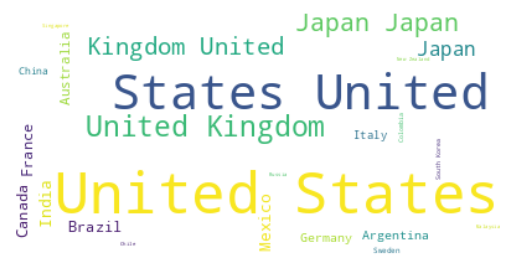

cluster 5


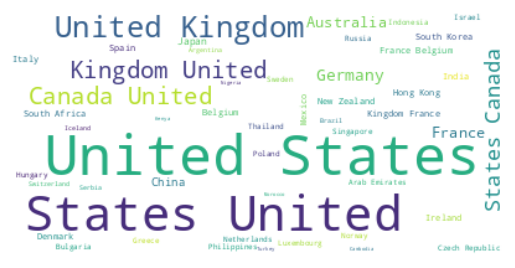

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

### ML Model - 2

####**Hierarchical clustering**

The hierarchical clustering algorithm can be represented by a dendrogram which makes it easy to visualize the structure of the clusters.

In [ ]:
# import libraries for clustering
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

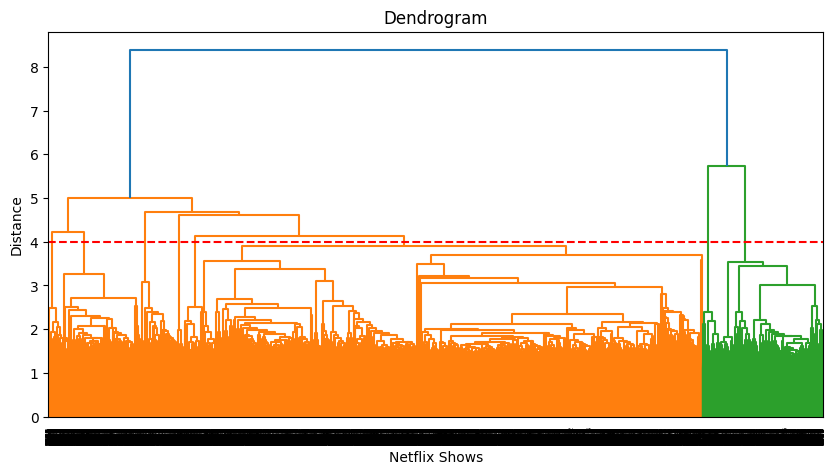

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 5))  
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm. Here we building 7 clusters using the Agglomerative clustering algorithm.

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')  
hierarchical.fit_predict(X)

array([1, 0, 0, ..., 0, 1, 0])

In [ ]:
# Adding a hierarchical cluster number attribute
df2['hierarchical_cluster'] = hierarchical.labels_

In [ ]:
# check dataframe
df2.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
7331,TV Show,Under Arrest,Dan Forrer,,United States,TV-MA,"Crime TV Shows, Docuseries, International TV S...",Cameras follow police officers as they solve c...,1
2606,TV Show,Happy 300 Days,,"Tammy Chen, Kingone Wang, Hsieh Kun Da, Chuang...",Taiwan,TV-14,"International TV Shows, Romantic TV Shows, TV ...",An unexpected pregnancy sends a woman back to ...,1
7131,Movie,Tokyo Idols,Kyoko Miyake,,"United Kingdom, Canada, Japan",TV-14,"Documentaries, International Movies, Music & M...",This documentary follows J-Pop idol Rio and he...,0
2726,Movie,High & Low The Red Rain,Yudai Yamaguchi,"Takahiro, Hiroomi Tosaka, Takumi Saitoh, Miyu ...",Japan,TV-MA,"Action & Adventure, International Movies",As the two younger Amamiya boys search for the...,0
2063,Movie,Exit Strategy,Michael Whitton,"Jameel Saleem, Kimelia Weathers, Quincy Harris...",United States,NR,"Comedies, Romantic Movies","When James's living situation turns sour, he h...",0


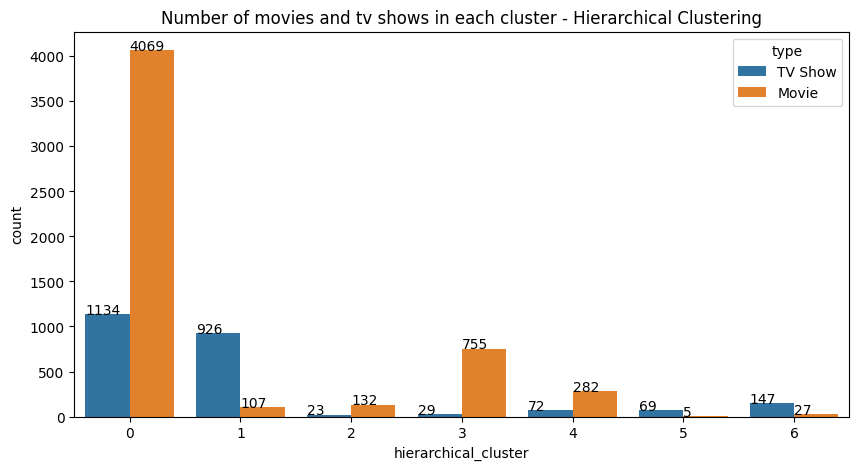

In [ ]:
# Check Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=df2, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

We have successfully built 7 clusters using the Agglomerative (hierarchical) clustering algorithm.

**Building wordclouds for different clusters in hierarchical Clustering**

In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  df2_wordcloud = df2[['hierarchical_cluster',column_name]].dropna()
  df2_wordcloud = df2_wordcloud[df2_wordcloud['hierarchical_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in df2_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Word Cloud on **"description"** column for different cluster

cluster 0


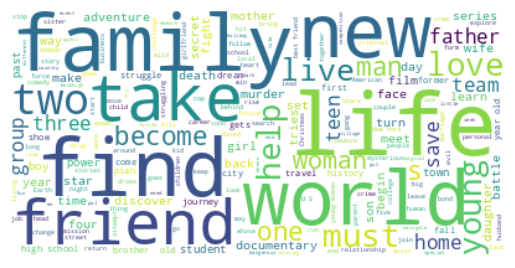

cluster 1


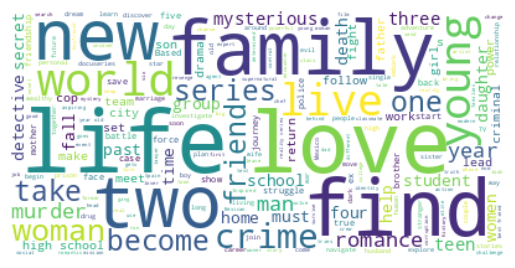

cluster 2


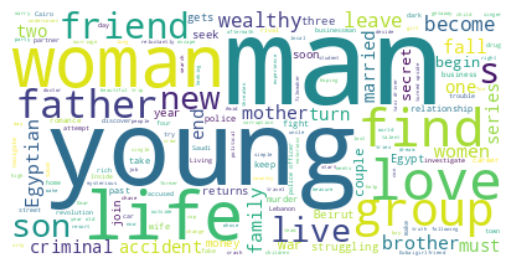

cluster 3


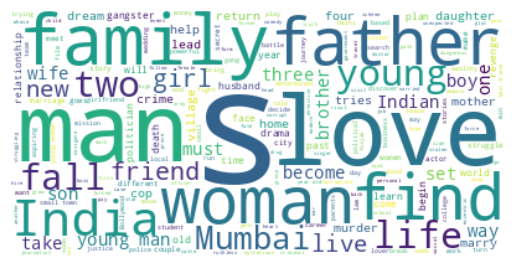

cluster 4


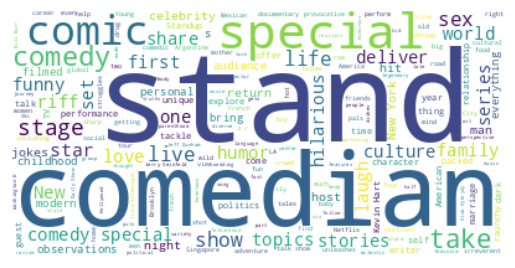

cluster 5


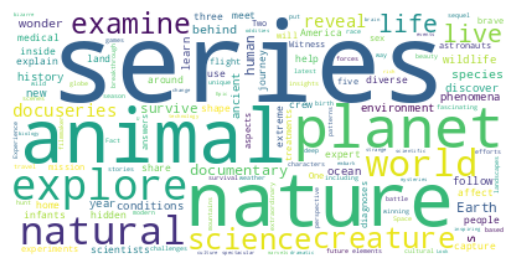

cluster 6


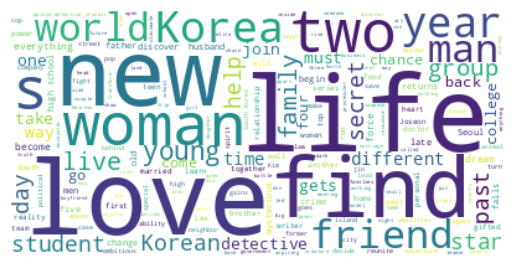

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

Word Cloud on **"listed_in" (genre)** col for different cluster

cluster 0


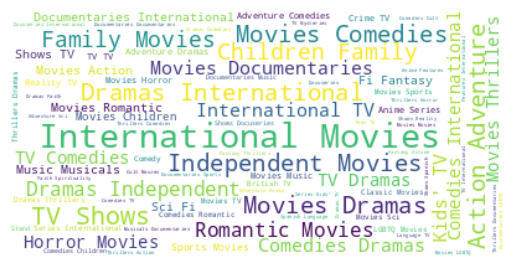

cluster 1


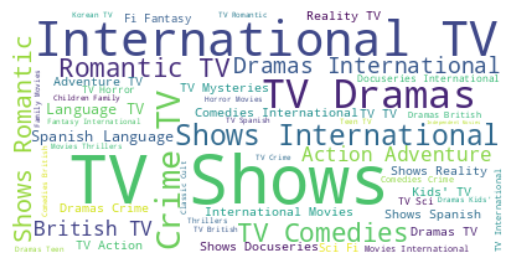

cluster 2


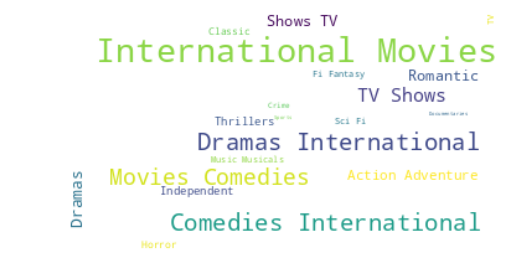

cluster 3


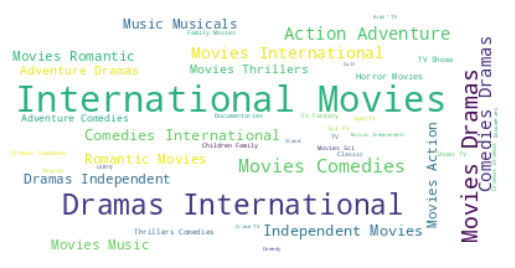

cluster 4


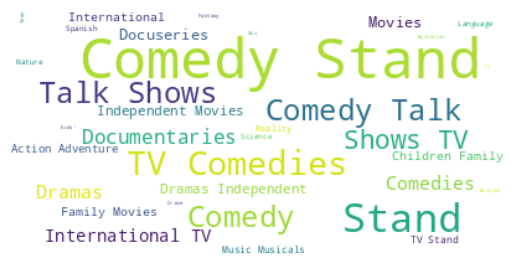

cluster 5


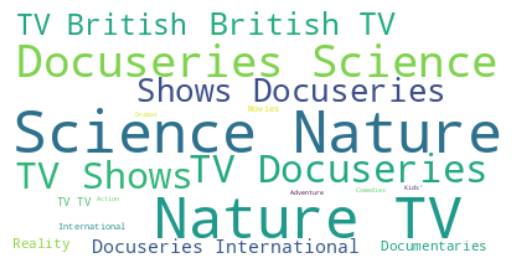

cluster 6


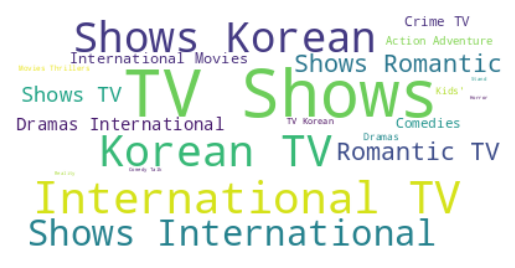

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

Word Cloud on **"cast"** column for different cluster

cluster 0


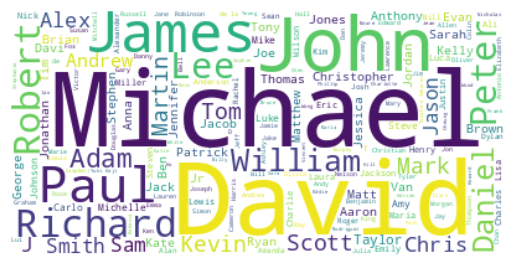

cluster 1


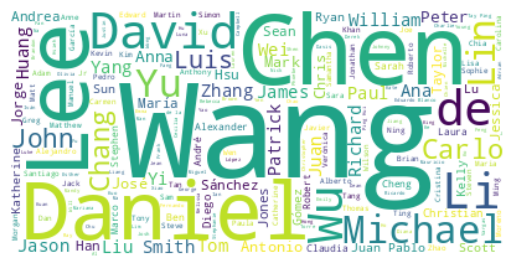

cluster 2


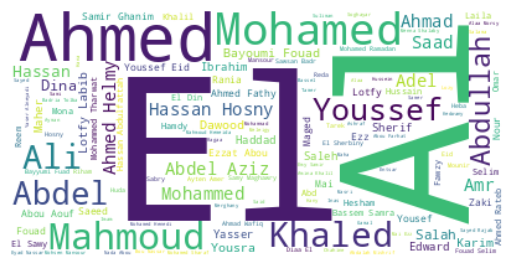

cluster 3


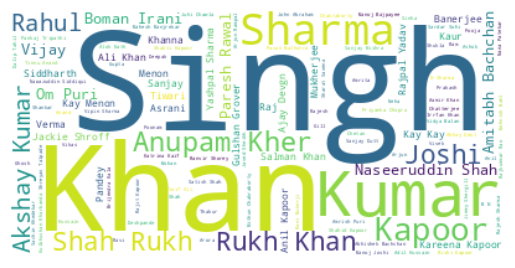

cluster 4


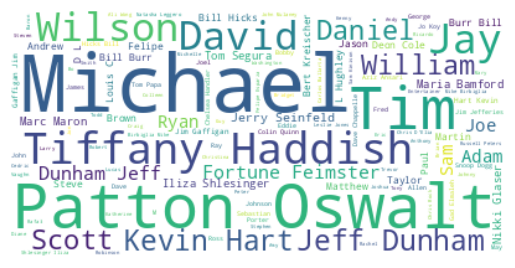

cluster 5


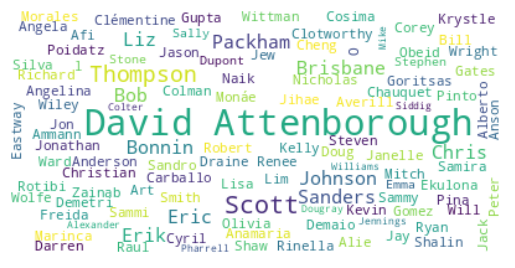

cluster 6


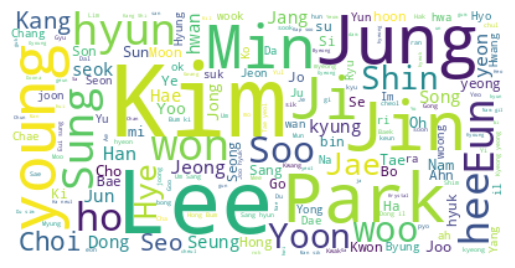

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

Word Cloud on **"director"** column for different cluster

cluster 0


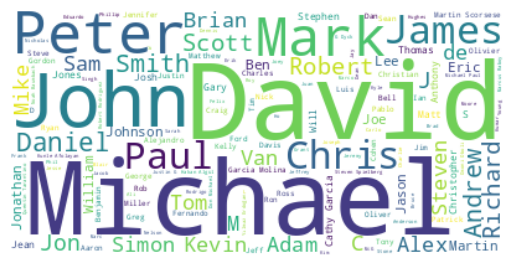

cluster 1


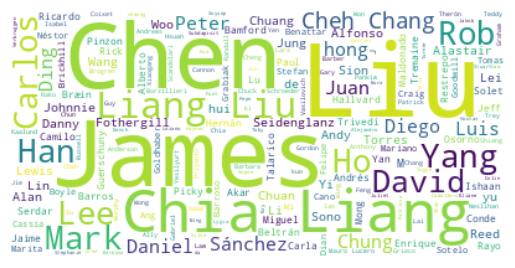

cluster 2


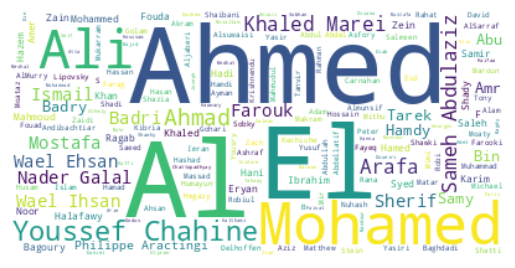

cluster 3


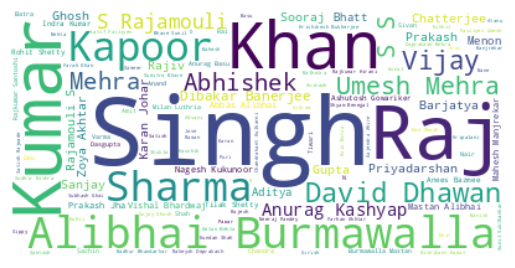

cluster 4


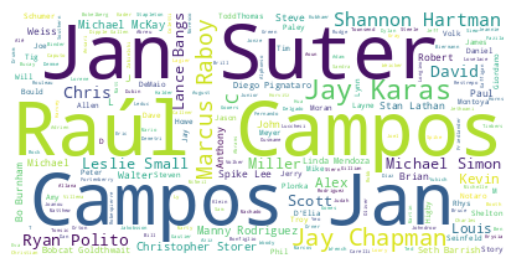

cluster 5


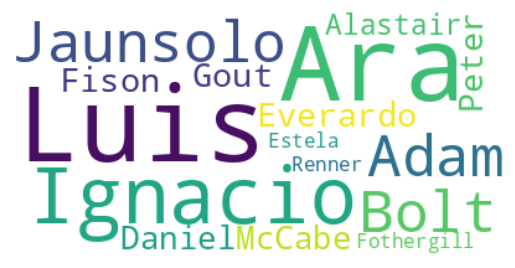

cluster 6


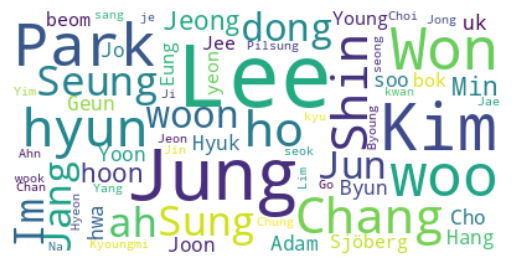

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'director')

Word Cloud on **"country"** column for different cluster

cluster 0


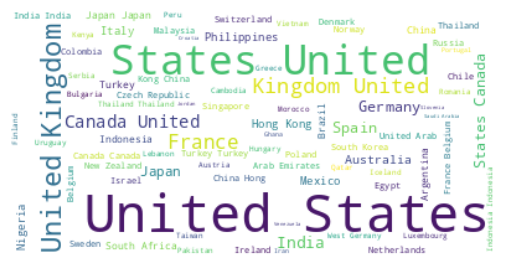

cluster 1


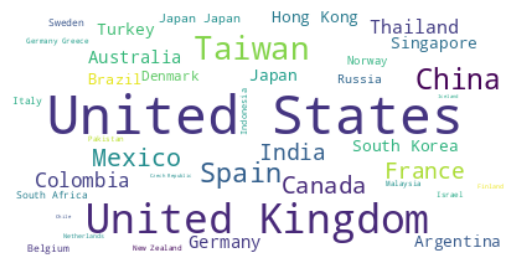

cluster 2


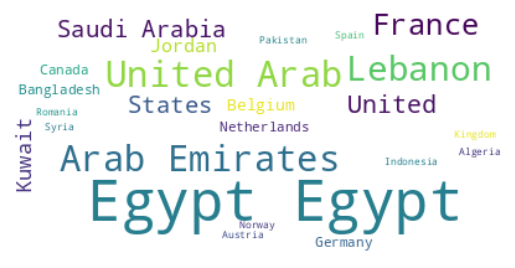

cluster 3


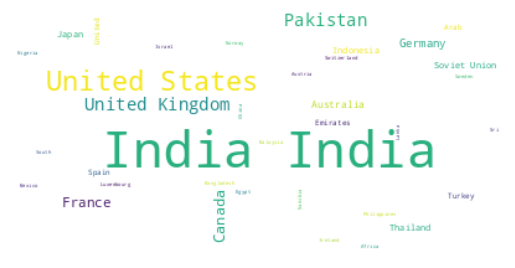

cluster 4


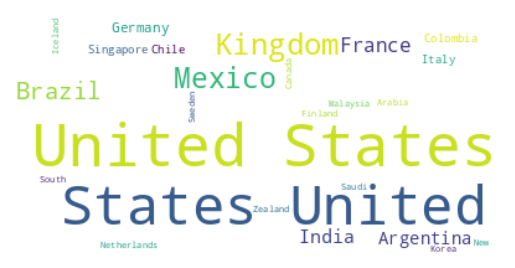

cluster 5


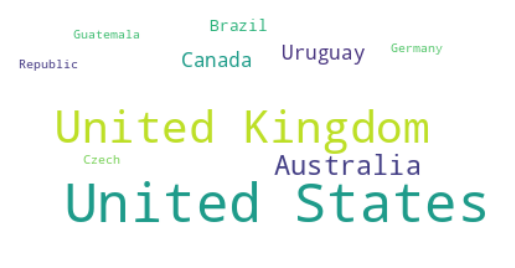

cluster 6


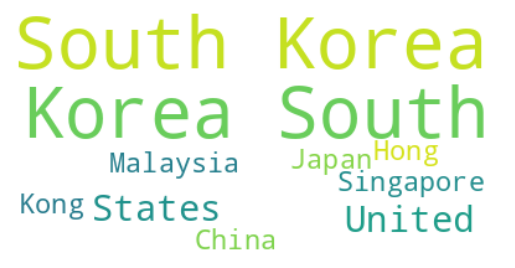

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')



###**Recommendation System**

A content-based recommendation system is a type of recommendation system that suggests items to users based on their similarity to other items that the user has shown interest in. It uses the attributes or features of the items to determine the similarity between them.

In [ ]:
# creating a copy of dataframe
df3 = df2.copy()

In [ ]:
# import libraries that are used to construct a recommendation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
# Changing the index of the dataframe from show id to show title
df3['show_id'] = df3.index

In [ ]:
# converting tokens to string
def convert(lst):
  return ' '.join(lst)

df3['text_data'] = df3['text_data'].apply(lambda x: convert(x))

we will calculate cosine similarity, in order to properly address index when developing the recommendation system. 

In [ ]:
# Cosine similarity
cosine_similarity = cosine_similarity(X)

In [ ]:
cosine_similarity.shape

(7777, 7777)

In [ ]:
# define a function to get 10 recommendations for a show
indices = pd.Series(df3.index)

def recommend_top10(title, cosine_sim = cosine_similarity):
  try:
    recommend_content = []   
    idx = indices[indices == title].index[0]
    series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)
    top10 = list(series.iloc[1:11].index)
    
    # list with the titles of the best 10 matching movies
    for i in top10:
      recommend_content.append(list(df3.index)[i])
    print("If you like this '"+title+"', you may also enjoy:\n")
    return recommend_content

  except:
    return 'Invalid Entry'

In [ ]:
recommend_top10('Phir Hera Pheri')

If you like this 'Phir Hera Pheri', you may also enjoy:



['Bhool Bhulaiyaa',
 'Chup Chup Ke',
 'Ready',
 'Khushi',
 'Golmaal: Fun Unlimited',
 'Thank You',
 'Bhagam Bhag',
 'Hasee Toh Phasee',
 'Hattrick',
 'Humko Deewana Kar Gaye']

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

**From EDA we observed that :**

* we have around 69% and 31% records of Movies and TV shows respectively.

* We see Netflix have highest release in 2019 followed by 2020 and 2018 and for each year release of Movies is more than TV shows.
Also The number of release have significantly increased after 2015 and have dropped in 2021 which may be due to Covid 19.

* We see more release happened in months October, November, December and January. Also for each month release of Movies is more than TV shows.

* We see most of contents are produced by united states followed by India.

* Most of the contents directed by;
##### **Alastair Fothergill** for TV shows.
##### **Raul Campos, Jan Suter** for movies.

* Most of the contents acted by;
##### **Takahiro Sakurai** for TV shows.
##### **Anupam Kher** for movies.

* we see TV-MA(adults) has highest rating in both cases (TV-shows/Movies) followed by TV-14 (Teens).

* For Movies - Top Genre postion took by Documentry followed by Stand-up Comedy and Dramas,International Movies.
* For TV shows - Top Genre postion took by kid's TV followed by International TV shows and TV Dramas

* We see most of Movies have duration of 90 to 100 minutes and most of TV shows have only single season.


I have implemented 2 Machine Learning models here - 

* **K- Means Clustering.**
* **Hierarchical clustering.**

* The problem of dimensionality was deal with use of **Principal Component Analysis (PCA)**.

* Utilizing the **K-Means Clustering algorithm**, we first constructed clusters, and **the optimal number of clusters was determined to be 6**. The elbow method and Silhouette score analysis were used to get this.

* The **Agglomerative clustering algorithm** was then used to create clusters, and the **optimal number of clusters was determined to be 7**. This was obtained after visualizing the dendrogram.

* The **similarity matrix** generated by applying cosine similarity was used to construct a **content-based recommender system**. The user will receive ten recommendations from this recommender system based on the type of show they watched.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***